In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.graph_objects as go
from sklearn.model_selection import train_test_split
from keras.models import Sequential
from keras.layers import Dense
from keras.layers import LSTM
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import TimeSeriesSplit
from keras.layers import Dropout
from sklearn.metrics import mean_squared_error,mean_absolute_percentage_error as mape,mean_absolute_error as mae
from keras import optimizers

# Prepare Data

In [2]:
def preparedata(file):
    cloud_cover = pd.read_csv(file, skipinitialspace = True)
    cloud_cover['Date'] = cloud_cover[['Year', 'Month', 'Day']].apply(lambda x: "{0}-{1}-{2}".format(str(x[0]).zfill(2), str(x[1]).zfill(2), str(x[2]).zfill(2)), axis=1) 
    cloud_cover['Time'] = cloud_cover[['Hour', 'Minute']].apply(lambda x: "{}:{}".format(str(x[0]).zfill(2), str(x[1]).zfill(2)), axis=1)
    cloud_cover.drop(["Year", "Month", "Day", "Hour", "Minute", "Second"], axis=1, inplace=True)  
    cloud_cover = cloud_cover.rename(columns={"CloudCover":"cloud_cover"})
    cloud_cover = cloud_cover.groupby(['Date', 'Time']).agg(cloud_cover=('cloud_cover','mean')).reset_index()
    cloud_cover['DateTime'] = cloud_cover[['Date', 'Time']].apply(lambda x: "{} {}".format(str(x[0]).zfill(2), str(x[1]).zfill(2)), axis=1)
    cloud_cover.drop(["Date", "Time"], axis=1, inplace=True)        
    cloud_cover['DateTime'] = pd.to_datetime(cloud_cover['DateTime'], format="%Y-%m-%d %H:%M")
    cloud_cover.dropna(inplace=True)
    return cloud_cover

In [3]:
cloud_cover = preparedata('../prophet_ver2/Bangkhuntean_CloudCover_2021-16Nov-16Dec.csv')
cloud_cover

,cloud_cover,DateTime
0,0.990000,2021-11-16 11:15:00
1,0.989000,2021-11-16 11:16:00
2,0.987667,2021-11-16 11:17:00
3,0.987000,2021-11-16 11:18:00
4,0.987000,2021-11-16 11:19:00
...,...,...
15056,0.168000,2021-12-16 13:58:00
15057,0.169000,2021-12-16 13:59:00
15058,0.147000,2021-12-16 14:00:00
15059,0.145000,2021-12-16 14:01:00


In [4]:
def lags_train_test(data, lags):
	X, y = [], []
	for i in range(lags, len(data)):
		X.append(data[i-lags:i])
		y.append(data[i])
	return np.array(X), np.array(y)

In [5]:
def Xtrain_ytrain(train,test,lags):
    #scale train
    sc = MinMaxScaler()
    sc.fit(train)
    train_set_scale = sc.transform(train)
    # train
    X_train, y_train = lags_train_test(train_set_scale, lags)
    X_train = np.reshape(X_train, (X_train.shape[0], X_train.shape[1], 1))
    print("X_train Shape :", X_train.shape)
    print("y_train Shape :", y_train.shape)

    #scale test
    dataset_total = pd.concat((train['cloud_cover'], test['cloud_cover']), axis=0)
    inputs = dataset_total[len(dataset_total) - len(test) - lags:].values
    inputs = inputs.reshape(-1,1)
    inputs = sc.transform(inputs)
    # test
    X_test, y_test = lags_train_test(inputs, lags)
    print("X_test Shape : ", X_test.shape)
    print("y_test Shape : ", y_test.shape)
    return X_train, y_train, X_test, y_test, sc

In [6]:
def plot_curve(history):
    # loss curves
    fig1 = plt.figure(figsize=[8,6])
    loss = history.history['loss']
    val_loss = history.history['val_loss']

    epochs = range(1, len(loss) + 1)

    plt.plot(epochs, loss, 'orange', label='Training loss')
    plt.plot(epochs, val_loss, 'b', label='Validation loss')
    plt.title('Training and validation loss')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()

In [7]:
def plot_curve(history):
    # loss curves
    fig1 = plt.figure(figsize=[8,6])
    loss = history.history['loss']
    val_loss = history.history['val_loss']

    epochs = range(1, len(loss) + 1)

    plt.plot(epochs, loss, 'orange', label='Training loss')
    plt.plot(epochs, val_loss, 'b', label='Validation loss')
    plt.title('Training and validation loss')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()

In [8]:
def plot_test(train,pred):
    fig2 = go.Figure()
    fig2.add_trace(go.Scatter(mode = 'lines', x = train['DateTime'], y = train['cloud_cover'], name = 'Train'))
    fig2.add_trace(go.Scatter(mode = 'lines', x = pred['DateTime'], y = pred['cloud_cover'], name = 'Actual'))
    fig2.add_trace(go.Scatter(mode = 'lines', x = pred['DateTime'], y = pred['LSTM'], name = 'Predict'))
    fig2.update_layout(
    autosize=True,
    height=600,
    title="LSTM Model",
    xaxis_title="Date",
    yaxis_title="Cloud cover",
    )


    fig2.update_layout(
        xaxis=dict(
            rangeselector=dict(
                buttons=list([
                    dict(count=1,
                        label="1.zoom",
                        step="hour",
                        stepmode="backward"),
                    dict(count=2,
                        label="2.zoom",
                        step="hour",
                        stepmode="backward"),
                    dict(count=3,
                        label="3.zoom",
                        step="day",
                        stepmode="backward"),              

                    dict(step="all")
                ])
            ),
            rangeslider=dict(
                visible=True
            ),
            type="date"
        )
    )

    fig2.show()

In [9]:
def compare_model(model,model_1):
    mse_error = [model,model_1]
    error = pd.DataFrame({"Model" : ['model','model_1'], "MSE error": mse_error})
    if model < model_1:
        model = model
        print("Better MSE value is : " , model)
    else:
        model_1 = model_1
        print("Better MSE value is : ", model_1)
    return error

In [10]:
def error(error1,error2,error3,error4):
    error = pd.DataFrame(columns=['MSE', 'RMSE', 'MAE', 'MAPE'])
    error = [{'MSE' : error1,'RMSE':error2,'MAE':error3,'MAPE':error4}]
    
    return error

# Train/Test Model

In [11]:
train = cloud_cover[cloud_cover['DateTime'] < '2021-12-16 00:00:00']
test = cloud_cover[cloud_cover['DateTime'] >= '2021-12-16 00:00:00']

train = train.set_index('DateTime')
test = test.set_index('DateTime')

X_train, y_train, X_test, y_test, sc = Xtrain_ytrain(train,test,10)

X_train Shape : (14758, 10, 1)
y_train Shape : (14758, 1)
X_test Shape :  (293, 10, 1)
y_test Shape :  (293, 1)


c:\Users\USER\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(


In [12]:
train

,cloud_cover
DateTime,
2021-11-16 11:15:00,0.990000
2021-11-16 11:16:00,0.989000
2021-11-16 11:17:00,0.987667
2021-11-16 11:18:00,0.987000
2021-11-16 11:19:00,0.987000
...,...
2021-12-15 16:55:00,0.321000
2021-12-15 16:56:00,0.304000
2021-12-15 16:57:00,0.286000


In [13]:
train.reset_index(inplace=True)
test.reset_index(inplace=True)

## Optimizer adam

### batch size 32 Add frist layer units = 50 epochs 10 

In [14]:
test1 = test.copy()

In [15]:
model_50_adam = Sequential()
model_50_adam.add(LSTM(units = 50, return_sequences = False, input_shape = (X_train.shape[1], 1)))
model_50_adam.add(Dense(units = 1))
model_50_adam.compile(optimizer = 'adam', loss = 'mean_squared_error')
hist_adam = model_50_adam.fit(X_train, y_train, validation_data=(X_test, y_test), epochs = 10, batch_size = 32)

Epoch 1/10
462/462 [==============================] - 8s 9ms/step - loss: 0.0075 - val_loss: 0.0050
Epoch 2/10
462/462 [==============================] - 3s 7ms/step - loss: 0.0024 - val_loss: 0.0037
Epoch 3/10
462/462 [==============================] - 3s 6ms/step - loss: 0.0020 - val_loss: 0.0030
Epoch 4/10
462/462 [==============================] - 3s 6ms/step - loss: 0.0017 - val_loss: 0.0027
Epoch 5/10
462/462 [==============================] - 3s 6ms/step - loss: 0.0015 - val_loss: 0.0022
Epoch 6/10
462/462 [==============================] - 3s 6ms/step - loss: 0.0014 - val_loss: 0.0021
Epoch 7/10
462/462 [==============================] - 3s 7ms/step - loss: 0.0013 - val_loss: 0.0021
Epoch 8/10
462/462 [==============================] - 3s 6ms/step - loss: 0.0012 - val_loss: 0.0019
Epoch 9/10
462/462 [==============================] - 3s 6ms/step - loss: 0.0012 - val_loss: 0.0019
Epoch 10/10
462/462 [==============================] - 3s 7ms/step - loss: 0.0012 - val_loss: 0.0018

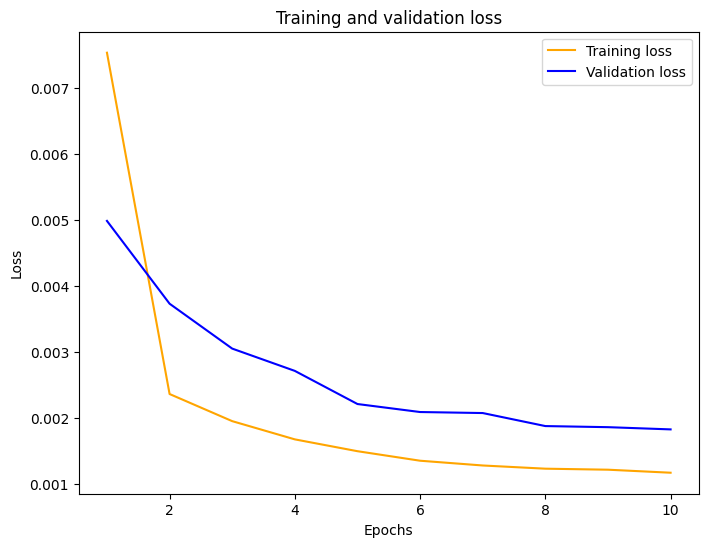

In [16]:
plot_curve(hist_adam)

In [17]:
predict_scaled_adam = model_50_adam.predict(X_test)
predict_adam = sc.inverse_transform(predict_scaled_adam)
test1['LSTM_adam'] = predict_adam
test1

10/10 [==============================] - 1s 6ms/step


,DateTime,cloud_cover,LSTM_adam
0,2021-12-16 09:10:00,0.111,0.324714
1,2021-12-16 09:11:00,0.112,0.136727
2,2021-12-16 09:12:00,0.116,0.116379
3,2021-12-16 09:13:00,0.112,0.117609
4,2021-12-16 09:14:00,0.099,0.114495
...,...,...,...
288,2021-12-16 13:58:00,0.168,0.166654
289,2021-12-16 13:59:00,0.169,0.166413
290,2021-12-16 14:00:00,0.147,0.167202
291,2021-12-16 14:01:00,0.145,0.148825


In [18]:
fig = go.Figure()
fig.add_trace(go.Scatter(mode = 'lines', x = cloud_cover['DateTime'], y = cloud_cover['cloud_cover'], name = 'Actual'))
fig.add_trace(go.Scatter(mode = 'lines', x = test1['DateTime'], y = test1['cloud_cover'], name = 'Actual Test'))
fig.add_trace(go.Scatter(mode = 'lines', x = test1['DateTime'], y = test1['LSTM_adam'], name = 'predict'))
fig.update_layout(
    autosize=True,
    height=600,
    title="LSTM Model",
    xaxis_title="Date",
    yaxis_title="Cloud cover",
)


fig.update_layout(
    xaxis=dict(
        rangeselector=dict(
            buttons=list([
                dict(count=1,
                     label="1.zoom",
                     step="hour",
                     stepmode="backward"),
                 dict(count=2,
                     label="2.zoom",
                     step="hour",
                     stepmode="backward"),
                dict(count=3,
                     label="3.zoom",
                     step="day",
                     stepmode="backward"),              

                dict(step="all")
            ])
        ),
        rangeslider=dict(
            visible=True
        ),
        type="date"
    )
)

fig.show()

In [19]:
lstm_mse_error_unit_50_adam = mean_squared_error(test1['cloud_cover'], test1['LSTM_adam'], squared=True)
lstm_rmse_error = mean_squared_error(test1["cloud_cover"], test1["LSTM_adam"], squared=False)
lstm_mae_error = mae(test1["cloud_cover"], test1["LSTM_adam"])
lstm_mape_error = mape(test1['cloud_cover'], test1['LSTM_adam'])
error(lstm_mse_error_unit_50_adam,lstm_rmse_error,lstm_mae_error,lstm_mape_error)


[{'MSE': 0.0018182121652603842,
  'RMSE': 0.042640499120676155,
  'MAE': 0.012135827302525881,
  'MAPE': 0.05442896365785532}]

In [166]:
mse_data = pd.DataFrame(columns=['Lags' ,'Optimizer', 'Batch_size', 'Learning rate', 'Frist layer', 'Drop out', 'Second layer', 'Drop out2', 'Third layer', 
                                 'Output layer', 'Epochs', 'MAE error', 'MAPE error','MSE error', 'RMSE error'])

data = [{'Lags':10 ,'Optimizer':'Adam', 'Batch_size':32, 'Learning rate':'', 'Frist layer': 50, 'Drop out':'', 'Second layer':'', 'Drop out2':'',
              'Third layer':'','Output layer':1, 'Epochs':10 , 'MAE error':lstm_mae_error, 'MAPE error' : lstm_mape_error,'MSE error':lstm_mse_error_unit_50_adam, 'RMSE error':lstm_rmse_error} ]

mse_data = mse_data.append(data,ignore_index = True,sort = False)
mse_data

C:\Users\USER\AppData\Local\Temp\ipykernel_6988\1792875040.py:7: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.



,Lags,Optimizer,Batch_size,Learning rate,Frist layer,Drop out,Second layer,Drop out2,Third layer,Output layer,Epochs,MAE error,MAPE error,MSE error,RMSE error
0,10,Adam,32,,50,,,,,1,10,0.012136,0.054429,0.001818,0.04264


---

## Optimizer RMSprop

### Add frist layer: units = 50

In [21]:
model_50_rms = Sequential()
model_50_rms.add(LSTM(units = 50, return_sequences = False, input_shape = (X_train.shape[1], 1)))
model_50_rms.add(Dense(units = 1))
model_50_rms.compile(optimizer = 'RMSprop', loss = 'mean_squared_error')
hist_50_rms = model_50_rms.fit(X_train, y_train, validation_data=(X_test, y_test), epochs = 10, batch_size = 32)

Epoch 1/10
462/462 [==============================] - 7s 8ms/step - loss: 0.0053 - val_loss: 0.0041
Epoch 2/10
462/462 [==============================] - 3s 6ms/step - loss: 0.0019 - val_loss: 0.0023
Epoch 3/10
462/462 [==============================] - 3s 6ms/step - loss: 0.0014 - val_loss: 0.0023
Epoch 4/10
462/462 [==============================] - 3s 6ms/step - loss: 0.0013 - val_loss: 0.0019
Epoch 5/10
462/462 [==============================] - 3s 6ms/step - loss: 0.0013 - val_loss: 0.0020
Epoch 6/10
462/462 [==============================] - 3s 6ms/step - loss: 0.0012 - val_loss: 0.0018
Epoch 7/10
462/462 [==============================] - 3s 7ms/step - loss: 0.0012 - val_loss: 0.0019
Epoch 8/10
462/462 [==============================] - 3s 6ms/step - loss: 0.0012 - val_loss: 0.0018
Epoch 9/10
462/462 [==============================] - 3s 6ms/step - loss: 0.0012 - val_loss: 0.0018
Epoch 10/10
462/462 [==============================] - 3s 6ms/step - loss: 0.0012 - val_loss: 0.0019

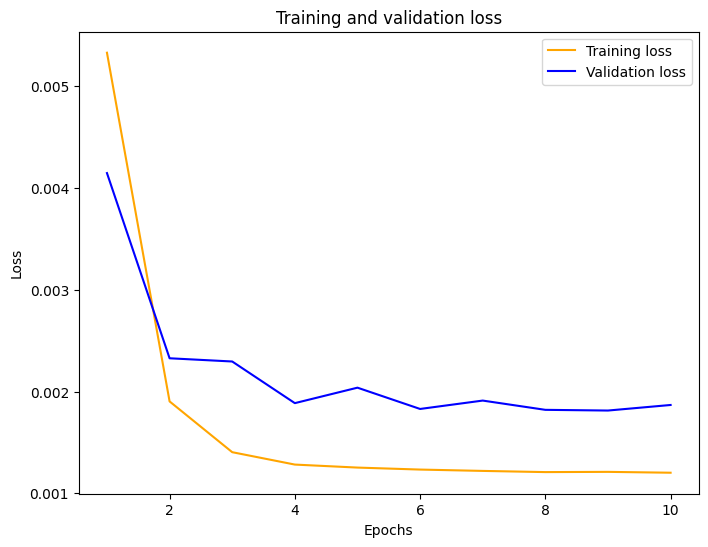

In [22]:
plot_curve(hist_50_rms)

In [23]:
predict_scaled_50_rms = model_50_rms.predict(X_test)
predict_50_rms = sc.inverse_transform(predict_scaled_50_rms)
test1['LSTM_50_rms'] = predict_50_rms
test1

10/10 [==============================] - 1s 2ms/step


,DateTime,cloud_cover,LSTM_adam,LSTM_50_rms
0,2021-12-16 09:10:00,0.111,0.324714,0.318273
1,2021-12-16 09:11:00,0.112,0.136727,0.119315
2,2021-12-16 09:12:00,0.116,0.116379,0.106838
3,2021-12-16 09:13:00,0.112,0.117609,0.109247
4,2021-12-16 09:14:00,0.099,0.114495,0.106846
...,...,...,...,...
288,2021-12-16 13:58:00,0.168,0.166654,0.160570
289,2021-12-16 13:59:00,0.169,0.166413,0.160455
290,2021-12-16 14:00:00,0.147,0.167202,0.161341
291,2021-12-16 14:01:00,0.145,0.148825,0.141257


In [24]:
fig = go.Figure()
fig.add_trace(go.Scatter(mode = 'lines', x = cloud_cover['DateTime'], y = cloud_cover['cloud_cover'], name = 'Actual'))
fig.add_trace(go.Scatter(mode = 'lines', x = test1['DateTime'], y = test1['cloud_cover'], name = 'Actual Test'))
fig.add_trace(go.Scatter(mode = 'lines', x = test1['DateTime'], y = test1['LSTM_50_rms'], name = 'predict'))
fig.update_layout(
    autosize=True,
    height=600,
    title="LSTM Model",
    xaxis_title="Date",
    yaxis_title="Cloud cover",
)


fig.update_layout(
    xaxis=dict(
        rangeselector=dict(
            buttons=list([
                dict(count=1,
                     label="1.zoom",
                     step="hour",
                     stepmode="backward"),
                 dict(count=2,
                     label="2.zoom",
                     step="hour",
                     stepmode="backward"),
                dict(count=3,
                     label="3.zoom",
                     step="day",
                     stepmode="backward"),              

                dict(step="all")
            ])
        ),
        rangeslider=dict(
            visible=True
        ),
        type="date"
    )
)

fig.show()

In [25]:
lstm_mse_error_unit_50_rms = mean_squared_error(test1['cloud_cover'], test1['LSTM_50_rms'], squared=True)
lstm_rmse_error1 = mean_squared_error(test1["cloud_cover"], test1["LSTM_50_rms"], squared=False)
lstm_mae_error1 = mae(test1["cloud_cover"], test1["LSTM_50_rms"])
lstm_mape_error1 = mape(test1['cloud_cover'], test1['LSTM_50_rms'])
error(lstm_mse_error_unit_50_rms,lstm_rmse_error1,lstm_mae_error1,lstm_mape_error1)

[{'MSE': 0.0018585960210939728,
  'RMSE': 0.04311143724226754,
  'MAE': 0.015239015855276546,
  'MAPE': 0.0719487804481865}]

In [26]:
compare_model(lstm_mape_error,lstm_mape_error1)

Better MSE value is :  0.05442896365785532


,Model,MSE error
0,model,0.054429
1,model_1,0.071949


In [167]:
data1 = [{'Lags':10 ,'Optimizer':'RMSprop', 'Batch_size':32, 'Learning rate':'', 'Frist layer': 50, 'Drop out':'', 'Second layer':'', 'Drop out2':'',
              'Third layer':'','Output layer':1, 'Epochs':10 , 'MAE error':lstm_mae_error1, 'MAPE error' : lstm_mape_error1,'MSE error':lstm_mse_error_unit_50_rms, 'RMSE error':lstm_rmse_error1}]

mse_data = mse_data.append(data1,ignore_index = True,sort = False)
mse_data

C:\Users\USER\AppData\Local\Temp\ipykernel_6988\3096648165.py:4: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.



,Lags,Optimizer,Batch_size,Learning rate,Frist layer,Drop out,Second layer,Drop out2,Third layer,Output layer,Epochs,MAE error,MAPE error,MSE error,RMSE error
0,10,Adam,32,,50,,,,,1,10,0.012136,0.054429,0.001818,0.042640
1,10,RMSprop,32,,50,,,,,1,10,0.015239,0.071949,0.001859,0.043111


---

## Optimizer adam

### Add frist layer: units = 50 and batch_size 64

In [28]:
model_batch_size64 = Sequential()
model_batch_size64.add(LSTM(units = 50, return_sequences = False, input_shape = (X_train.shape[1], 1)))
model_batch_size64.add(Dense(units = 1))
model_batch_size64.compile(optimizer = 'adam', loss = 'mean_squared_error')
hist_batch_size64 = model_batch_size64.fit(X_train, y_train, validation_data=(X_test, y_test),  epochs = 10, batch_size = 64)

Epoch 1/10
231/231 [==============================] - 6s 11ms/step - loss: 0.0157 - val_loss: 0.0063
Epoch 2/10
231/231 [==============================] - 2s 8ms/step - loss: 0.0032 - val_loss: 0.0055
Epoch 3/10
231/231 [==============================] - 2s 8ms/step - loss: 0.0027 - val_loss: 0.0046
Epoch 4/10
231/231 [==============================] - 2s 8ms/step - loss: 0.0023 - val_loss: 0.0038
Epoch 5/10
231/231 [==============================] - 2s 8ms/step - loss: 0.0021 - val_loss: 0.0034
Epoch 6/10
231/231 [==============================] - 2s 8ms/step - loss: 0.0019 - val_loss: 0.0031
Epoch 7/10
231/231 [==============================] - 2s 8ms/step - loss: 0.0018 - val_loss: 0.0029
Epoch 8/10
231/231 [==============================] - 2s 8ms/step - loss: 0.0016 - val_loss: 0.0026
Epoch 9/10
231/231 [==============================] - 2s 8ms/step - loss: 0.0015 - val_loss: 0.0025
Epoch 10/10
231/231 [==============================] - 2s 8ms/step - loss: 0.0014 - val_loss: 0.002

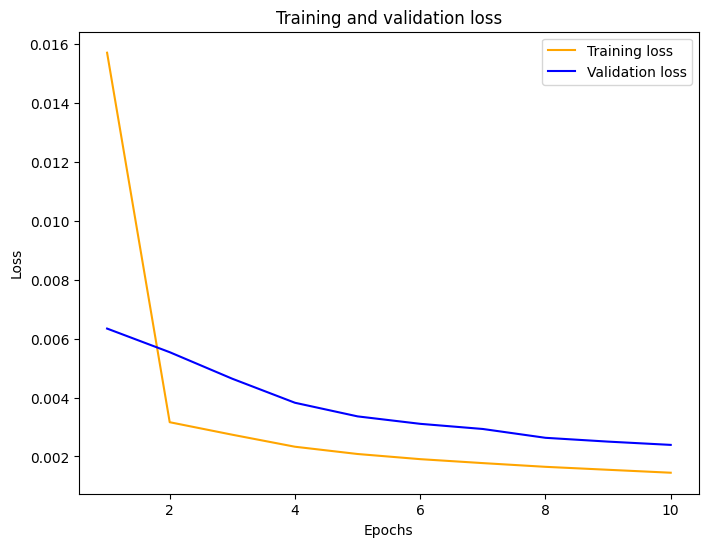

In [29]:
plot_curve(hist_batch_size64)

In [30]:
predict_scaled_batch_size64 = model_batch_size64.predict(X_test)
predict_batch_size64 = sc.inverse_transform(predict_scaled_batch_size64)
test1['LSTM_4_batch_size'] = predict_batch_size64
test1

10/10 [==============================] - 1s 3ms/step


,DateTime,cloud_cover,LSTM_adam,LSTM_50_rms,LSTM_4_batch_size
0,2021-12-16 09:10:00,0.111,0.324714,0.318273,0.332843
1,2021-12-16 09:11:00,0.112,0.136727,0.119315,0.232177
2,2021-12-16 09:12:00,0.116,0.116379,0.106838,0.168514
3,2021-12-16 09:13:00,0.112,0.117609,0.109247,0.137629
4,2021-12-16 09:14:00,0.099,0.114495,0.106846,0.123490
...,...,...,...,...,...
288,2021-12-16 13:58:00,0.168,0.166654,0.160570,0.176193
289,2021-12-16 13:59:00,0.169,0.166413,0.160455,0.175812
290,2021-12-16 14:00:00,0.147,0.167202,0.161341,0.176057
291,2021-12-16 14:01:00,0.145,0.148825,0.141257,0.166683


In [31]:
fig = go.Figure()
fig.add_trace(go.Scatter(mode = 'lines', x = cloud_cover['DateTime'], y = cloud_cover['cloud_cover'], name = 'Actual'))
fig.add_trace(go.Scatter(mode = 'lines', x = test1['DateTime'], y = test1['cloud_cover'], name = 'Actual Test'))
fig.add_trace(go.Scatter(mode = 'lines', x = test1['DateTime'], y = test1['LSTM_4_batch_size'], name = 'predict'))
fig.update_layout(
    autosize=True,
    height=600,
    title="LSTM Model",
    xaxis_title="Date",
    yaxis_title="Cloud cover",
)


fig.update_layout(
    xaxis=dict(
        rangeselector=dict(
            buttons=list([
                dict(count=1,
                     label="1.zoom",
                     step="hour",
                     stepmode="backward"),
                 dict(count=2,
                     label="2.zoom",
                     step="hour",
                     stepmode="backward"),
                dict(count=3,
                     label="3.zoom",
                     step="day",
                     stepmode="backward"),              

                dict(step="all")
            ])
        ),
        rangeslider=dict(
            visible=True
        ),
        type="date"
    )
)

fig.show()

In [32]:
lstm_mse_error_batch_size64 = mean_squared_error(test1['cloud_cover'], test1['LSTM_4_batch_size'], squared=True)
lstm_rmse_error2 = mean_squared_error(test1["cloud_cover"], test1["LSTM_4_batch_size"], squared=False)
lstm_mae_error2 = mae(test1["cloud_cover"], test1["LSTM_4_batch_size"])
lstm_mape_error2 = mape(test1['cloud_cover'], test1['LSTM_4_batch_size'])
error(lstm_mse_error_batch_size64,lstm_rmse_error2,lstm_mae_error2,lstm_mape_error2)

[{'MSE': 0.00238005305538038,
  'RMSE': 0.04878578743220591,
  'MAE': 0.017186386621039065,
  'MAPE': 0.0875722535644801}]

In [33]:
compare_model(lstm_mape_error,lstm_mape_error2)

Better MSE value is :  0.05442896365785532


,Model,MSE error
0,model,0.054429
1,model_1,0.087572


In [168]:
data2 = [{'Lags':10 ,'Optimizer':'Adam', 'Batch_size':64, 'Learning rate':'', 'Frist layer': 50, 'Drop out':'', 'Second layer':'', 'Drop out2':'',
              'Third layer':'','Output layer':1, 'Epochs':10 , 'MAE error':lstm_mae_error2, 'MAPE error' : lstm_mape_error2,'MSE error':lstm_mse_error_batch_size64
              , 'RMSE error':lstm_rmse_error2}]

mse_data = mse_data.append(data2,ignore_index = True,sort = False)
mse_data

C:\Users\USER\AppData\Local\Temp\ipykernel_6988\2982867882.py:5: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.



,Lags,Optimizer,Batch_size,Learning rate,Frist layer,Drop out,Second layer,Drop out2,Third layer,Output layer,Epochs,MAE error,MAPE error,MSE error,RMSE error
0,10,Adam,32,,50,,,,,1,10,0.012136,0.054429,0.001818,0.042640
1,10,RMSprop,32,,50,,,,,1,10,0.015239,0.071949,0.001859,0.043111
2,10,Adam,64,,50,,,,,1,10,0.017186,0.087572,0.002380,0.048786


---

### learning rate 0.1

In [35]:
test2 = test.copy()

#### Add frist layer: units = 50

In [36]:
model_01 = Sequential()
model_01.add(LSTM(units = 50, return_sequences = False, input_shape = (X_train.shape[1], 1)))
model_01.add(Dense(units = 1))
opt = optimizers.Adam(learning_rate=0.1)
model_01.compile(optimizer = opt, loss = 'mean_squared_error')
hist_01 = model_01.fit(X_train, y_train, validation_data=(X_test, y_test), epochs = 10, batch_size = 32)

Epoch 1/10
462/462 [==============================] - 7s 8ms/step - loss: 0.2075 - val_loss: 0.1324
Epoch 2/10
462/462 [==============================] - 3s 6ms/step - loss: 0.1656 - val_loss: 0.1953
Epoch 3/10
462/462 [==============================] - 3s 6ms/step - loss: 0.1429 - val_loss: 0.3843
Epoch 4/10
462/462 [==============================] - 3s 6ms/step - loss: 0.1493 - val_loss: 0.2782
Epoch 5/10
462/462 [==============================] - 3s 6ms/step - loss: 0.1547 - val_loss: 0.3282
Epoch 6/10
462/462 [==============================] - 3s 6ms/step - loss: 0.1624 - val_loss: 0.0657
Epoch 7/10
462/462 [==============================] - 3s 6ms/step - loss: 0.1538 - val_loss: 0.0506
Epoch 8/10
462/462 [==============================] - 3s 6ms/step - loss: 0.1484 - val_loss: 0.1315
Epoch 9/10
462/462 [==============================] - 3s 6ms/step - loss: 0.1604 - val_loss: 0.3239
Epoch 10/10
462/462 [==============================] - 3s 6ms/step - loss: 0.1509 - val_loss: 0.0359

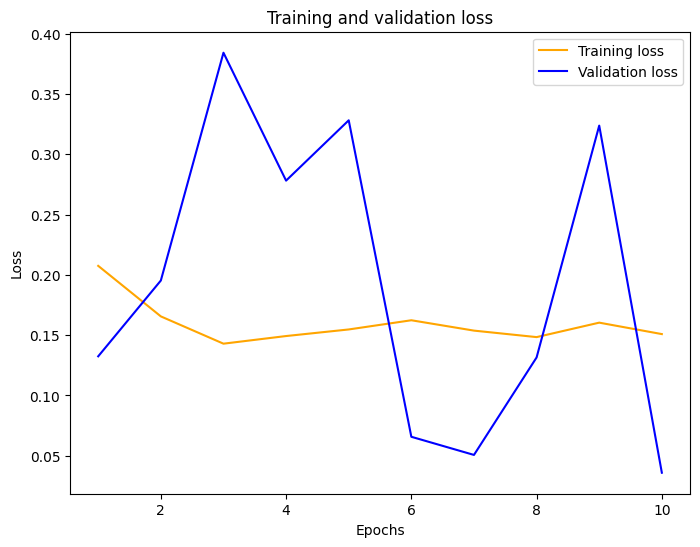

In [37]:
plot_curve(hist_01)

In [38]:
predict_scaled_01 = model_01.predict(X_test)
predict_01 = sc.inverse_transform(predict_scaled_01)
test2['LSTM_01'] = predict_01
test2

10/10 [==============================] - 1s 3ms/step


,DateTime,cloud_cover,LSTM_01
0,2021-12-16 09:10:00,0.111,0.327141
1,2021-12-16 09:11:00,0.112,0.327141
2,2021-12-16 09:12:00,0.116,0.327141
3,2021-12-16 09:13:00,0.112,0.327141
4,2021-12-16 09:14:00,0.099,0.327141
...,...,...,...
288,2021-12-16 13:58:00,0.168,0.327141
289,2021-12-16 13:59:00,0.169,0.327141
290,2021-12-16 14:00:00,0.147,0.327141
291,2021-12-16 14:01:00,0.145,0.327141


In [39]:
fig = go.Figure()
fig.add_trace(go.Scatter(mode = 'lines', x = cloud_cover['DateTime'], y = cloud_cover['cloud_cover'], name = 'Actual'))
fig.add_trace(go.Scatter(mode = 'lines', x = test2['DateTime'], y = test2['cloud_cover'], name = 'Actual Test'))
fig.add_trace(go.Scatter(mode = 'lines', x = test2['DateTime'], y = test2['LSTM_01'], name = 'predict'))
fig.update_layout(
    autosize=True,
    height=600,
    title="LSTM Model",
    xaxis_title="Date",
    yaxis_title="Cloud cover",
)


fig.update_layout(
    xaxis=dict(
        rangeselector=dict(
            buttons=list([
                dict(count=1,
                     label="1.zoom",
                     step="hour",
                     stepmode="backward"),
                 dict(count=2,
                     label="2.zoom",
                     step="hour",
                     stepmode="backward"),
                dict(count=3,
                     label="3.zoom",
                     step="day",
                     stepmode="backward"),              

                dict(step="all")
            ])
        ),
        rangeslider=dict(
            visible=True
        ),
        type="date"
    )
)

fig.show()

In [40]:
lstm_mse_error_unit_50_01 = mean_squared_error(test2['cloud_cover'], test2['LSTM_01'], squared=True)
lstm_rmse_error3 = mean_squared_error(test2["cloud_cover"], test2["LSTM_01"], squared=False)
lstm_mae_error3 = mae(test2["cloud_cover"], test2["LSTM_01"])
lstm_mape_error3 = mape(test2['cloud_cover'], test2['LSTM_01'])
error(lstm_mse_error_unit_50_01,lstm_rmse_error3,lstm_mae_error3,lstm_mape_error3)

[{'MSE': 0.03569060770357055,
  'RMSE': 0.1889195799899273,
  'MAE': 0.16748105593671572,
  'MAPE': 0.9115094660596731}]

In [41]:
compare_model(lstm_mape_error,lstm_mape_error3)

Better MSE value is :  0.05442896365785532


,Model,MSE error
0,model,0.054429
1,model_1,0.911509


In [169]:
data3 = [{'Lags':10 ,'Optimizer':'Adam', 'Batch_size':32, 'Learning rate':0.1, 'Frist layer': 50, 'Drop out':'', 'Second layer':'', 'Drop out2':'',
              'Third layer':'','Output layer':1, 'Epochs':10 , 'MAE error':lstm_mae_error3, 'MAPE error' : lstm_mape_error3,'MSE error':lstm_mse_error_unit_50_01, 'RMSE error':lstm_rmse_error3}]

mse_data = mse_data.append(data3,ignore_index = True,sort = False)
mse_data

C:\Users\USER\AppData\Local\Temp\ipykernel_6988\2741850415.py:4: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.



,Lags,Optimizer,Batch_size,Learning rate,Frist layer,Drop out,Second layer,Drop out2,Third layer,Output layer,Epochs,MAE error,MAPE error,MSE error,RMSE error
0,10,Adam,32,,50,,,,,1,10,0.012136,0.054429,0.001818,0.042640
1,10,RMSprop,32,,50,,,,,1,10,0.015239,0.071949,0.001859,0.043111
2,10,Adam,64,,50,,,,,1,10,0.017186,0.087572,0.002380,0.048786
3,10,Adam,32,0.1,50,,,,,1,10,0.167481,0.911509,0.035691,0.188920


----------------------------------------------------------------------------------

### lr 0.05

#### Add frist layer: units = 50

In [43]:
model_005 = Sequential()
model_005.add(LSTM(units = 50, return_sequences = False, input_shape = (X_train.shape[1], 1)))
model_005.add(Dense(units = 1))
opt = optimizers.Adam(learning_rate=0.05)
model_005.compile(optimizer = opt, loss = 'mean_squared_error')
hist_005 = model_005.fit(X_train, y_train, validation_data=(X_test, y_test), epochs = 10, batch_size = 32)

Epoch 1/10
462/462 [==============================] - 7s 8ms/step - loss: 0.0239 - val_loss: 0.0028
Epoch 2/10
462/462 [==============================] - 3s 6ms/step - loss: 0.0016 - val_loss: 0.0020
Epoch 3/10
462/462 [==============================] - 3s 6ms/step - loss: 0.0014 - val_loss: 0.0019
Epoch 4/10
462/462 [==============================] - 3s 6ms/step - loss: 0.0013 - val_loss: 0.0019
Epoch 5/10
462/462 [==============================] - 3s 7ms/step - loss: 0.0013 - val_loss: 0.0022
Epoch 6/10
462/462 [==============================] - 3s 6ms/step - loss: 0.0014 - val_loss: 0.0019
Epoch 7/10
462/462 [==============================] - 3s 6ms/step - loss: 0.0013 - val_loss: 0.0019
Epoch 8/10
462/462 [==============================] - 3s 6ms/step - loss: 0.0013 - val_loss: 0.0023
Epoch 9/10
462/462 [==============================] - 3s 6ms/step - loss: 0.0013 - val_loss: 0.0021
Epoch 10/10
462/462 [==============================] - 3s 7ms/step - loss: 0.0013 - val_loss: 0.0021

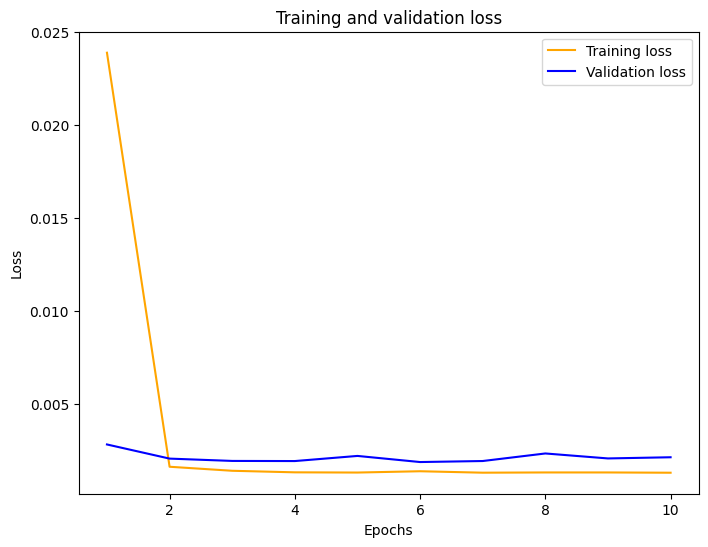

In [44]:
plot_curve(hist_005)

In [45]:
predict_scaled_005 = model_005.predict(X_test)
predict_005 = sc.inverse_transform(predict_scaled_005)
test2['LSTM_005'] = predict_005
test2

10/10 [==============================] - 1s 2ms/step


,DateTime,cloud_cover,LSTM_01,LSTM_005
0,2021-12-16 09:10:00,0.111,0.327141,0.301955
1,2021-12-16 09:11:00,0.112,0.327141,0.092214
2,2021-12-16 09:12:00,0.116,0.327141,0.105077
3,2021-12-16 09:13:00,0.112,0.327141,0.103522
4,2021-12-16 09:14:00,0.099,0.327141,0.092960
...,...,...,...,...
288,2021-12-16 13:58:00,0.168,0.327141,0.149394
289,2021-12-16 13:59:00,0.169,0.327141,0.149697
290,2021-12-16 14:00:00,0.147,0.327141,0.150604
291,2021-12-16 14:01:00,0.145,0.327141,0.128014


In [46]:
fig = go.Figure()
fig.add_trace(go.Scatter(mode = 'lines', x = cloud_cover['DateTime'], y = cloud_cover['cloud_cover'], name = 'Actual'))
fig.add_trace(go.Scatter(mode = 'lines', x = test2['DateTime'], y = test2['cloud_cover'], name = 'Actual Test'))
fig.add_trace(go.Scatter(mode = 'lines', x = test2['DateTime'], y = test2['LSTM_005'], name = 'predict'))
fig.update_layout(
    autosize=True,
    height=600,
    title="LSTM Model",
    xaxis_title="Date",
    yaxis_title="Cloud cover",
)


fig.update_layout(
    xaxis=dict(
        rangeselector=dict(
            buttons=list([
                dict(count=1,
                     label="1.zoom",
                     step="hour",
                     stepmode="backward"),
                 dict(count=2,
                     label="2.zoom",
                     step="hour",
                     stepmode="backward"),
                dict(count=3,
                     label="3.zoom",
                     step="day",
                     stepmode="backward"),              

                dict(step="all")
            ])
        ),
        rangeslider=dict(
            visible=True
        ),
        type="date"
    )
)

fig.show()

In [47]:
lstm_mse_error_unit_50_005 = mean_squared_error(test2['cloud_cover'], test2['LSTM_005'], squared=True)
lstm_rmse_error4 = mean_squared_error(test2["cloud_cover"], test2["LSTM_005"], squared=False)
lstm_mae_error4 = mae(test2["cloud_cover"], test2["LSTM_005"])
lstm_mape_error4 = mape(test2['cloud_cover'], test2['LSTM_005'])

error(lstm_mse_error_unit_50_005,lstm_rmse_error4,lstm_mae_error4,lstm_mape_error4)

[{'MSE': 0.0021035067802259873,
  'RMSE': 0.0458640030985738,
  'MAE': 0.024615870991867964,
  'MAPE': 0.12437521481643894}]

In [48]:
compare_model(lstm_mape_error,lstm_mape_error4)

Better MSE value is :  0.05442896365785532


,Model,MSE error
0,model,0.054429
1,model_1,0.124375


In [170]:
data4 = [{'Lags':10 ,'Optimizer':'Adam', 'Batch_size':32, 'Learning rate':0.05, 'Frist layer': 50, 'Drop out':'', 'Second layer':'', 'Drop out2':'',
              'Third layer':'','Output layer':1, 'Epochs':10 , 'MAE error':lstm_mae_error4, 'MAPE error' : lstm_mape_error4,'MSE error':lstm_mse_error_unit_50_005, 'RMSE error':lstm_rmse_error4}]

mse_data = mse_data.append(data4,ignore_index = True,sort = False)
mse_data

C:\Users\USER\AppData\Local\Temp\ipykernel_6988\3986911690.py:4: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.



,Lags,Optimizer,Batch_size,Learning rate,Frist layer,Drop out,Second layer,Drop out2,Third layer,Output layer,Epochs,MAE error,MAPE error,MSE error,RMSE error
0,10,Adam,32,,50,,,,,1,10,0.012136,0.054429,0.001818,0.042640
1,10,RMSprop,32,,50,,,,,1,10,0.015239,0.071949,0.001859,0.043111
2,10,Adam,64,,50,,,,,1,10,0.017186,0.087572,0.002380,0.048786
3,10,Adam,32,0.1,50,,,,,1,10,0.167481,0.911509,0.035691,0.188920
4,10,Adam,32,0.05,50,,,,,1,10,0.024616,0.124375,0.002104,0.045864


----------------------------------------------------------------------------------

### lr 0.01

#### Add frist layer: units = 50

In [50]:
model_001 = Sequential()
model_001.add(LSTM(units = 50, return_sequences = False, input_shape = (X_train.shape[1], 1)))
model_001.add(Dense(units = 1))
opt = optimizers.Adam(learning_rate=0.01)
model_001.compile(optimizer = opt, loss = 'mean_squared_error')
hist_001 = model_001.fit(X_train, y_train, validation_data=(X_test, y_test), epochs = 10, batch_size = 32)

Epoch 1/10
462/462 [==============================] - 8s 8ms/step - loss: 0.0035 - val_loss: 0.0024
Epoch 2/10
462/462 [==============================] - 3s 6ms/step - loss: 0.0013 - val_loss: 0.0019
Epoch 3/10
462/462 [==============================] - 3s 7ms/step - loss: 0.0012 - val_loss: 0.0018
Epoch 4/10
462/462 [==============================] - 3s 6ms/step - loss: 0.0012 - val_loss: 0.0019
Epoch 5/10
462/462 [==============================] - 3s 6ms/step - loss: 0.0012 - val_loss: 0.0019
Epoch 6/10
462/462 [==============================] - 3s 6ms/step - loss: 0.0013 - val_loss: 0.0019
Epoch 7/10
462/462 [==============================] - 3s 6ms/step - loss: 0.0012 - val_loss: 0.0020
Epoch 8/10
462/462 [==============================] - 3s 6ms/step - loss: 0.0013 - val_loss: 0.0018
Epoch 9/10
462/462 [==============================] - 3s 6ms/step - loss: 0.0013 - val_loss: 0.0020
Epoch 10/10
462/462 [==============================] - 3s 6ms/step - loss: 0.0012 - val_loss: 0.0018

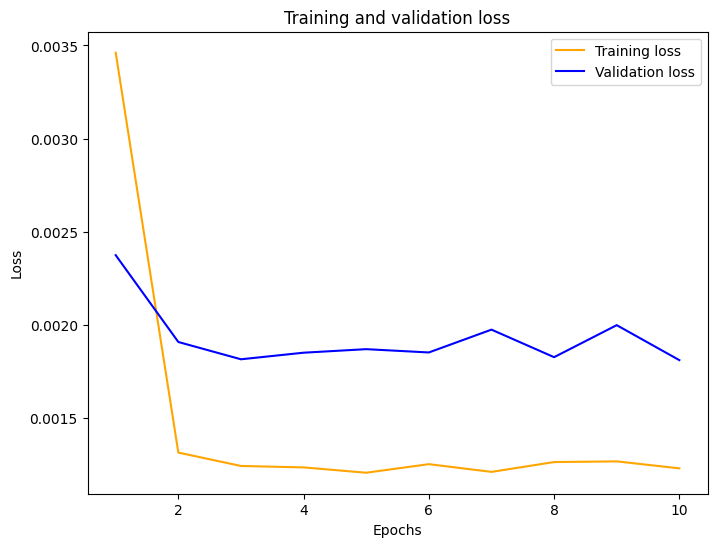

In [51]:
plot_curve(hist_001)

In [52]:
predict_scaled_001 = model_001.predict(X_test)
predict_001 = sc.inverse_transform(predict_scaled_001)
test2['LSTM_001'] = predict_001
test2

10/10 [==============================] - 1s 2ms/step


,DateTime,cloud_cover,LSTM_01,LSTM_005,LSTM_001
0,2021-12-16 09:10:00,0.111,0.327141,0.301955,0.329430
1,2021-12-16 09:11:00,0.112,0.327141,0.092214,0.126383
2,2021-12-16 09:12:00,0.116,0.327141,0.105077,0.111967
3,2021-12-16 09:13:00,0.112,0.327141,0.103522,0.121292
4,2021-12-16 09:14:00,0.099,0.327141,0.092960,0.120954
...,...,...,...,...,...
288,2021-12-16 13:58:00,0.168,0.327141,0.149394,0.174403
289,2021-12-16 13:59:00,0.169,0.327141,0.149697,0.174306
290,2021-12-16 14:00:00,0.147,0.327141,0.150604,0.175258
291,2021-12-16 14:01:00,0.145,0.327141,0.128014,0.154319


In [53]:
fig = go.Figure()
fig.add_trace(go.Scatter(mode = 'lines', x = cloud_cover['DateTime'], y = cloud_cover['cloud_cover'], name = 'Actual'))
fig.add_trace(go.Scatter(mode = 'lines', x = test2['DateTime'], y = test2['cloud_cover'], name = 'Actual Test'))
fig.add_trace(go.Scatter(mode = 'lines', x = test2['DateTime'], y = test2['LSTM_001'], name = 'predict'))
fig.update_layout(
    autosize=True,
    height=600,
    title="LSTM Model",
    xaxis_title="Date",
    yaxis_title="Cloud cover",
)


fig.update_layout(
    xaxis=dict(
        rangeselector=dict(
            buttons=list([
                dict(count=1,
                     label="1.zoom",
                     step="hour",
                     stepmode="backward"),
                 dict(count=2,
                     label="2.zoom",
                     step="hour",
                     stepmode="backward"),
                dict(count=3,
                     label="3.zoom",
                     step="day",
                     stepmode="backward"),              

                dict(step="all")
            ])
        ),
        rangeslider=dict(
            visible=True
        ),
        type="date"
    )
)

fig.show()

In [54]:
lstm_mse_error_001 = mean_squared_error(test2['cloud_cover'], test2['LSTM_001'], squared=True)
lstm_rmse_error5 = mean_squared_error(test2["cloud_cover"], test2["LSTM_001"], squared=False)
lstm_mae_error5 = mae(test2["cloud_cover"], test2["LSTM_001"])
lstm_mape_error5 = mape(test2['cloud_cover'], test2['LSTM_001'])
error(lstm_mse_error_001,lstm_rmse_error5,lstm_mae_error5,lstm_mape_error5)

[{'MSE': 0.0018012185371996886,
  'RMSE': 0.042440765040226223,
  'MAE': 0.013826061089697956,
  'MAPE': 0.06746688438670331}]

In [55]:
compare_model(lstm_mape_error,lstm_mape_error5)

Better MSE value is :  0.05442896365785532


,Model,MSE error
0,model,0.054429
1,model_1,0.067467


In [171]:
data5 = [{'Lags':10 ,'Optimizer':'Adam', 'Batch_size':32, 'Learning rate':0.01, 'Frist layer': 50, 'Drop out':'', 'Second layer':'', 'Drop out2':'',
              'Third layer':'','Output layer':1, 'Epochs':10 , 'MAE error':lstm_mae_error5, 'MAPE error' : lstm_mape_error5,'MSE error':lstm_mse_error_001, 'RMSE error':lstm_rmse_error5}]

mse_data = mse_data.append(data5,ignore_index = True,sort = False)
mse_data

C:\Users\USER\AppData\Local\Temp\ipykernel_6988\2745978531.py:4: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.



,Lags,Optimizer,Batch_size,Learning rate,Frist layer,Drop out,Second layer,Drop out2,Third layer,Output layer,Epochs,MAE error,MAPE error,MSE error,RMSE error
0,10,Adam,32,,50,,,,,1,10,0.012136,0.054429,0.001818,0.042640
1,10,RMSprop,32,,50,,,,,1,10,0.015239,0.071949,0.001859,0.043111
2,10,Adam,64,,50,,,,,1,10,0.017186,0.087572,0.002380,0.048786
3,10,Adam,32,0.1,50,,,,,1,10,0.167481,0.911509,0.035691,0.188920
4,10,Adam,32,0.05,50,,,,,1,10,0.024616,0.124375,0.002104,0.045864
5,10,Adam,32,0.01,50,,,,,1,10,0.013826,0.067467,0.001801,0.042441


----------------------------------------------------------------------------------

### lr 0.005

#### Add frist layer: units = 50

In [159]:
model_0005 = Sequential()
model_0005.add(LSTM(units = 50, return_sequences = False, input_shape = (X_train.shape[1], 1)))
model_0005.add(Dense(units = 1))
opt = optimizers.Adam(learning_rate=0.005)
model_0005.compile(optimizer = opt, loss = 'mean_squared_error')
hist_0005 = model_0005.fit(X_train, y_train, validation_data=(X_test, y_test), epochs = 10, batch_size = 32)

Epoch 1/10
462/462 [==============================] - 10s 10ms/step - loss: 0.0039 - val_loss: 0.0030
Epoch 2/10
462/462 [==============================] - 3s 6ms/step - loss: 0.0016 - val_loss: 0.0022
Epoch 3/10
462/462 [==============================] - 3s 6ms/step - loss: 0.0013 - val_loss: 0.0019
Epoch 4/10
462/462 [==============================] - 3s 6ms/step - loss: 0.0012 - val_loss: 0.0018
Epoch 5/10
462/462 [==============================] - 3s 6ms/step - loss: 0.0012 - val_loss: 0.0019
Epoch 6/10
462/462 [==============================] - 3s 6ms/step - loss: 0.0012 - val_loss: 0.0018
Epoch 7/10
462/462 [==============================] - 3s 6ms/step - loss: 0.0012 - val_loss: 0.0018
Epoch 8/10
462/462 [==============================] - 3s 6ms/step - loss: 0.0012 - val_loss: 0.0018
Epoch 9/10
462/462 [==============================] - 3s 6ms/step - loss: 0.0012 - val_loss: 0.0018
Epoch 10/10
462/462 [==============================] - 3s 6ms/step - loss: 0.0012 - val_loss: 0.00

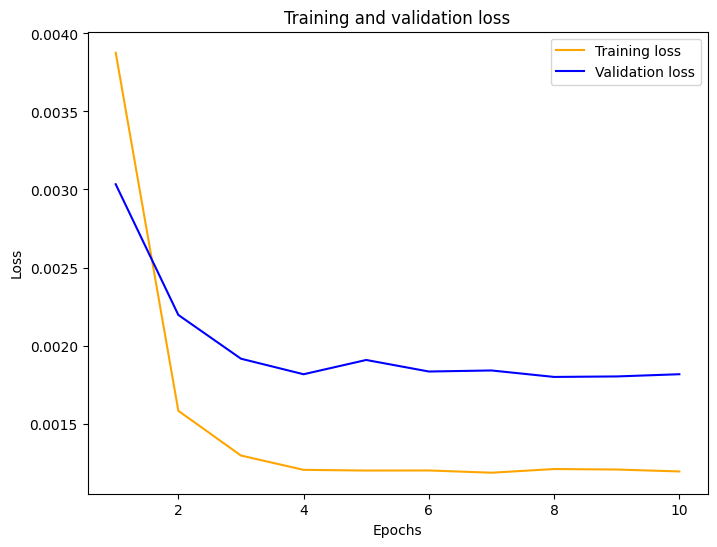

In [160]:
plot_curve(hist_0005)

In [161]:
predict_scaled_0005 = model_0005.predict(X_test)
predict_0005 = sc.inverse_transform(predict_scaled_0005)
test2['LSTM_0005'] = predict_0005
test2

10/10 [==============================] - 1s 2ms/step


,DateTime,cloud_cover,LSTM_01,LSTM_005,LSTM_001,LSTM_0005,LSTM_0001
0,2021-12-16 09:10:00,0.111,0.327141,0.301955,0.329430,0.323517,0.329430
1,2021-12-16 09:11:00,0.112,0.327141,0.092214,0.126383,0.127081,0.126383
2,2021-12-16 09:12:00,0.116,0.327141,0.105077,0.111967,0.123621,0.111967
3,2021-12-16 09:13:00,0.112,0.327141,0.103522,0.121292,0.123571,0.121292
4,2021-12-16 09:14:00,0.099,0.327141,0.092960,0.120954,0.118212,0.120954
...,...,...,...,...,...,...,...
288,2021-12-16 13:58:00,0.168,0.327141,0.149394,0.174403,0.168932,0.174403
289,2021-12-16 13:59:00,0.169,0.327141,0.149697,0.174306,0.168910,0.174306
290,2021-12-16 14:00:00,0.147,0.327141,0.150604,0.175258,0.169761,0.175258
291,2021-12-16 14:01:00,0.145,0.327141,0.128014,0.154319,0.149542,0.154319


In [162]:
fig = go.Figure()
fig.add_trace(go.Scatter(mode = 'lines', x = cloud_cover['DateTime'], y = cloud_cover['cloud_cover'], name = 'Actual'))
fig.add_trace(go.Scatter(mode = 'lines', x = test2['DateTime'], y = test2['cloud_cover'], name = 'Actual Test'))
fig.add_trace(go.Scatter(mode = 'lines', x = test2['DateTime'], y = test2['LSTM_0005'], name = 'predict'))
fig.update_layout(
    autosize=True,
    height=600,
    title="LSTM Model",
    xaxis_title="Date",
    yaxis_title="Cloud cover",
)


fig.update_layout(
    xaxis=dict(
        rangeselector=dict(
            buttons=list([
                dict(count=1,
                     label="1.zoom",
                     step="hour",
                     stepmode="backward"),
                 dict(count=2,
                     label="2.zoom",
                     step="hour",
                     stepmode="backward"),
                dict(count=3,
                     label="3.zoom",
                     step="day",
                     stepmode="backward"),              

                dict(step="all")
            ])
        ),
        rangeslider=dict(
            visible=True
        ),
        type="date"
    )
)

fig.show()

In [164]:
lstm_mse_error_unit_50_0005 = mean_squared_error(test2['cloud_cover'], test2['LSTM_0005'], squared=True)
lstm_rmse_error6 = mean_squared_error(test2["cloud_cover"], test2["LSTM_0005"], squared=False)
lstm_mae_error6 = mae(test2["cloud_cover"], test2["LSTM_0005"])
lstm_mape_error6 = mape(test2['cloud_cover'], test2['LSTM_0005'])
# error(lstm_mse_error_unit_50_0005,lstm_rmse_error6,lstm_mae_error6,lstm_mape_error6)

In [165]:
compare_model(lstm_mape_error,lstm_mape_error6)

Better MSE value is :  0.05333231226971766


,Model,MSE error
0,model,0.054429
1,model_1,0.053332


In [172]:
data5 = [{'Lags':10 ,'Optimizer':'Adam', 'Batch_size':32, 'Learning rate':0.005, 'Frist layer': 50, 'Drop out':'', 'Second layer':'', 'Drop out2':'',
              'Third layer':'','Output layer':1, 'Epochs':10 , 'MAE error':lstm_mae_error6, 'MAPE error' : lstm_mape_error6,'MSE error':lstm_mse_error_unit_50_0005, 'RMSE error':lstm_rmse_error6}]

mse_data = mse_data.append(data5,ignore_index = True,sort = False)
mse_data

C:\Users\USER\AppData\Local\Temp\ipykernel_6988\2925054423.py:4: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.



,Lags,Optimizer,Batch_size,Learning rate,Frist layer,Drop out,Second layer,Drop out2,Third layer,Output layer,Epochs,MAE error,MAPE error,MSE error,RMSE error
0,10,Adam,32,,50,,,,,1,10,0.012136,0.054429,0.001818,0.042640
1,10,RMSprop,32,,50,,,,,1,10,0.015239,0.071949,0.001859,0.043111
2,10,Adam,64,,50,,,,,1,10,0.017186,0.087572,0.002380,0.048786
3,10,Adam,32,0.1,50,,,,,1,10,0.167481,0.911509,0.035691,0.188920
4,10,Adam,32,0.05,50,,,,,1,10,0.024616,0.124375,0.002104,0.045864
5,10,Adam,32,0.01,50,,,,,1,10,0.013826,0.067467,0.001801,0.042441
6,10,Adam,32,0.005,50,,,,,1,10,0.011539,0.053332,0.001807,0.042510


----------------------------------------------------------------------------------

### lr 0.001

#### Add frist layer: units = 50

In [64]:
model_0001 = Sequential()
model_0001.add(LSTM(units = 50, return_sequences = False, input_shape = (X_train.shape[1], 1)))
model_0001.add(Dense(units = 1))
opt = optimizers.Adam(learning_rate=0.001)
model_0001.compile(optimizer = opt, loss = 'mean_squared_error')
hist_0001 = model_0001.fit(X_train, y_train, validation_data=(X_test, y_test), epochs = 10, batch_size = 32)

Epoch 1/10
462/462 [==============================] - 8s 8ms/step - loss: 0.0112 - val_loss: 0.0060
Epoch 2/10
462/462 [==============================] - 3s 7ms/step - loss: 0.0028 - val_loss: 0.0043
Epoch 3/10
462/462 [==============================] - 3s 6ms/step - loss: 0.0022 - val_loss: 0.0034
Epoch 4/10
462/462 [==============================] - 3s 7ms/step - loss: 0.0019 - val_loss: 0.0029
Epoch 5/10
462/462 [==============================] - 3s 6ms/step - loss: 0.0016 - val_loss: 0.0027
Epoch 6/10
462/462 [==============================] - 3s 6ms/step - loss: 0.0015 - val_loss: 0.0022
Epoch 7/10
462/462 [==============================] - 3s 7ms/step - loss: 0.0013 - val_loss: 0.0021
Epoch 8/10
462/462 [==============================] - 3s 6ms/step - loss: 0.0013 - val_loss: 0.0020
Epoch 9/10
462/462 [==============================] - 3s 6ms/step - loss: 0.0012 - val_loss: 0.0019
Epoch 10/10
462/462 [==============================] - 3s 7ms/step - loss: 0.0012 - val_loss: 0.0019

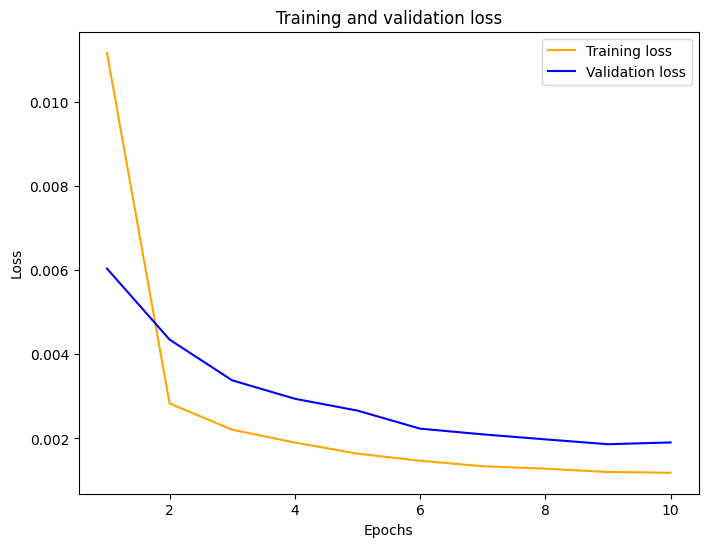

In [65]:
plot_curve(hist_0001)

In [66]:
predict_scaled_0001 = model_001.predict(X_test)
predict_0001 = sc.inverse_transform(predict_scaled_0001)
test2['LSTM_0001'] = predict_0001
test2

10/10 [==============================] - 0s 3ms/step


,DateTime,cloud_cover,LSTM_01,LSTM_005,LSTM_001,LSTM_0005,LSTM_0001
0,2021-12-16 09:10:00,0.111,0.327141,0.301955,0.329430,0.328873,0.329430
1,2021-12-16 09:11:00,0.112,0.327141,0.092214,0.126383,0.129101,0.126383
2,2021-12-16 09:12:00,0.116,0.327141,0.105077,0.111967,0.109798,0.111967
3,2021-12-16 09:13:00,0.112,0.327141,0.103522,0.121292,0.114621,0.121292
4,2021-12-16 09:14:00,0.099,0.327141,0.092960,0.120954,0.113974,0.120954
...,...,...,...,...,...,...,...
288,2021-12-16 13:58:00,0.168,0.327141,0.149394,0.174403,0.169124,0.174403
289,2021-12-16 13:59:00,0.169,0.327141,0.149697,0.174306,0.168930,0.174306
290,2021-12-16 14:00:00,0.147,0.327141,0.150604,0.175258,0.169825,0.175258
291,2021-12-16 14:01:00,0.145,0.327141,0.128014,0.154319,0.149844,0.154319


In [67]:
fig = go.Figure()
fig.add_trace(go.Scatter(mode = 'lines', x = cloud_cover['DateTime'], y = cloud_cover['cloud_cover'], name = 'Actual'))
fig.add_trace(go.Scatter(mode = 'lines', x = test2['DateTime'], y = test2['cloud_cover'], name = 'Actual Test'))
fig.add_trace(go.Scatter(mode = 'lines', x = test2['DateTime'], y = test2['LSTM_0001'], name = 'predict'))
fig.update_layout(
    autosize=True,
    height=600,
    title="LSTM Model",
    xaxis_title="Date",
    yaxis_title="Cloud cover",
)


fig.update_layout(
    xaxis=dict(
        rangeselector=dict(
            buttons=list([
                dict(count=1,
                     label="1.zoom",
                     step="hour",
                     stepmode="backward"),
                 dict(count=2,
                     label="2.zoom",
                     step="hour",
                     stepmode="backward"),
                dict(count=3,
                     label="3.zoom",
                     step="day",
                     stepmode="backward"),              

                dict(step="all")
            ])
        ),
        rangeslider=dict(
            visible=True
        ),
        type="date"
    )
)

fig.show()

In [68]:
lstm_mse_error_0001 = mean_squared_error(test2['cloud_cover'], test2['LSTM_0001'], squared=True)
lstm_rmse_error7 = mean_squared_error(test2["cloud_cover"], test2["LSTM_0001"], squared=False)
lstm_mae_error7 = mae(test2["cloud_cover"], test2["LSTM_0001"])
lstm_mape_error7 = mape(test2['cloud_cover'], test2['LSTM_0001'])
error(lstm_mse_error_0001,lstm_rmse_error7,lstm_mae_error7,lstm_mape_error7)


[{'MSE': 0.0018012185371996886,
  'RMSE': 0.042440765040226223,
  'MAE': 0.013826061089697956,
  'MAPE': 0.06746688438670331}]

In [174]:
compare_model(lstm_mape_error6,lstm_mape_error7)

Better MSE value is :  0.05333231226971766


,Model,MSE error
0,model,0.053332
1,model_1,0.067467


In [173]:
data6 = [{'Lags':10 ,'Optimizer':'Adam', 'Batch_size':32, 'Learning rate':0.001, 'Frist layer': 50, 'Drop out':'', 'Second layer':'', 'Drop out2':'',
              'Third layer':'','Output layer':1, 'Epochs':10 , 'MAE error':lstm_mae_error7, 'MAPE error' : lstm_mape_error7,'MSE error':lstm_mse_error_0001, 'RMSE error':lstm_rmse_error7}]

mse_data = mse_data.append(data6,ignore_index = True,sort = False)
mse_data

C:\Users\USER\AppData\Local\Temp\ipykernel_6988\3123148227.py:4: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.



,Lags,Optimizer,Batch_size,Learning rate,Frist layer,Drop out,Second layer,Drop out2,Third layer,Output layer,Epochs,MAE error,MAPE error,MSE error,RMSE error
0,10,Adam,32,,50,,,,,1,10,0.012136,0.054429,0.001818,0.042640
1,10,RMSprop,32,,50,,,,,1,10,0.015239,0.071949,0.001859,0.043111
2,10,Adam,64,,50,,,,,1,10,0.017186,0.087572,0.002380,0.048786
3,10,Adam,32,0.1,50,,,,,1,10,0.167481,0.911509,0.035691,0.188920
4,10,Adam,32,0.05,50,,,,,1,10,0.024616,0.124375,0.002104,0.045864
5,10,Adam,32,0.01,50,,,,,1,10,0.013826,0.067467,0.001801,0.042441
6,10,Adam,32,0.005,50,,,,,1,10,0.011539,0.053332,0.001807,0.042510
7,10,Adam,32,0.001,50,,,,,1,10,0.013826,0.067467,0.001801,0.042441


----------------------------------------------------------------------------------

## Optimizer adam

### Add frist layer: units = 100

In [122]:
test3 = test.copy()

In [123]:
test3['LSTM_50'] = predict_0005

In [124]:
model_1 = Sequential()
model_1.add(LSTM(units = 100, return_sequences = False, input_shape = (X_train.shape[1], 1)))
model_1.add(Dense(units = 1))
opt = optimizers.Adam(learning_rate=0.005)
model_1.compile(optimizer = opt, loss = 'mean_squared_error')
hist_1 = model_1.fit(X_train, y_train, validation_data=(X_test, y_test), epochs = 10, batch_size = 32)

Epoch 1/10
462/462 [==============================] - 11s 13ms/step - loss: 0.0043 - val_loss: 0.0030
Epoch 2/10
462/462 [==============================] - 6s 12ms/step - loss: 0.0015 - val_loss: 0.0021
Epoch 3/10
462/462 [==============================] - 6s 13ms/step - loss: 0.0013 - val_loss: 0.0019
Epoch 4/10
462/462 [==============================] - 5s 12ms/step - loss: 0.0012 - val_loss: 0.0018
Epoch 5/10
462/462 [==============================] - 6s 14ms/step - loss: 0.0012 - val_loss: 0.0019
Epoch 6/10
462/462 [==============================] - 8s 17ms/step - loss: 0.0012 - val_loss: 0.0018
Epoch 7/10
462/462 [==============================] - 7s 16ms/step - loss: 0.0012 - val_loss: 0.0018
Epoch 8/10
462/462 [==============================] - 8s 18ms/step - loss: 0.0012 - val_loss: 0.0019
Epoch 9/10
462/462 [==============================] - 5s 10ms/step - loss: 0.0012 - val_loss: 0.0018
Epoch 10/10
462/462 [==============================] - 4s 9ms/step - loss: 0.0012 - val_lo

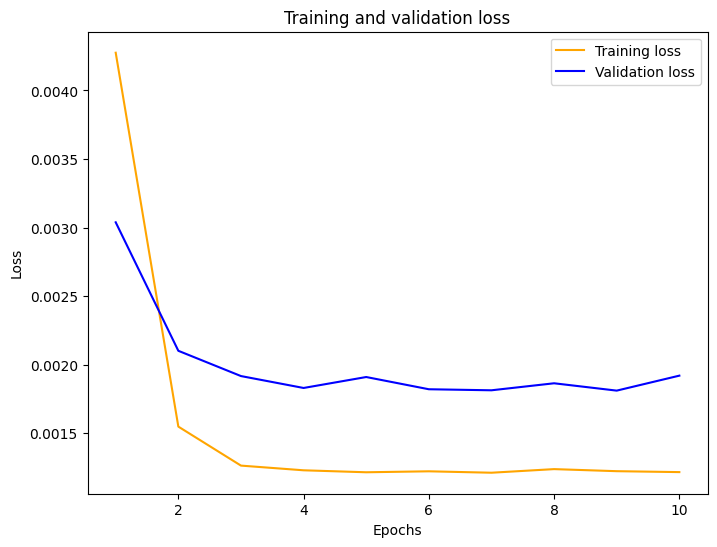

In [125]:
plot_curve(hist_1)

In [126]:
predict_scaled_1 = model_1.predict(X_test)
predict_1 = sc.inverse_transform(predict_scaled_1)
test3['LSTM_100'] = predict_1
test3

10/10 [==============================] - 1s 7ms/step


,DateTime,cloud_cover,LSTM_50,LSTM_100
0,2021-12-16 09:10:00,0.111,0.328873,0.306985
1,2021-12-16 09:11:00,0.112,0.129101,0.113523
2,2021-12-16 09:12:00,0.116,0.109798,0.124393
3,2021-12-16 09:13:00,0.112,0.114621,0.115149
4,2021-12-16 09:14:00,0.099,0.113974,0.108481
...,...,...,...,...
288,2021-12-16 13:58:00,0.168,0.169124,0.158052
289,2021-12-16 13:59:00,0.169,0.168930,0.158258
290,2021-12-16 14:00:00,0.147,0.169825,0.159020
291,2021-12-16 14:01:00,0.145,0.149844,0.138359


In [127]:
fig = go.Figure()
fig.add_trace(go.Scatter(mode = 'lines', x = cloud_cover['DateTime'], y = cloud_cover['cloud_cover'], name = 'Actual'))
fig.add_trace(go.Scatter(mode = 'lines', x = test3['DateTime'], y = test3['cloud_cover'], name = 'Actual Test'))
fig.add_trace(go.Scatter(mode = 'lines', x = test3['DateTime'], y = test3['LSTM_100'], name = 'predict'))
fig.update_layout(
    autosize=True,
    height=600,
    title="LSTM Model",
    xaxis_title="Date",
    yaxis_title="Cloud cover",
)


fig.update_layout(
    xaxis=dict(
        rangeselector=dict(
            buttons=list([
                dict(count=1,
                     label="1.zoom",
                     step="hour",
                     stepmode="backward"),
                 dict(count=2,
                     label="2.zoom",
                     step="hour",
                     stepmode="backward"),
                dict(count=3,
                     label="3.zoom",
                     step="day",
                     stepmode="backward"),              

                dict(step="all")
            ])
        ),
        rangeslider=dict(
            visible=True
        ),
        type="date"
    )
)

fig.show()

In [129]:
lstm_mse_error_unit_100 = mean_squared_error(test3['cloud_cover'], test3['LSTM_100'], squared=True)
lstm_rmse_error8 = mean_squared_error(test3["cloud_cover"], test3["LSTM_100"], squared=False)
lstm_mae_error8 = mae(test3["cloud_cover"], test3["LSTM_100"])
lstm_mape_error8 = mape(test3['cloud_cover'], test3['LSTM_100'])
# error(lstm_mse_error_unit_100,lstm_rmse_error8,lstm_mae_error8,lstm_mape_error8)

In [175]:
compare_model(lstm_mape_error6,lstm_mape_error8)

Better MSE value is :  0.05333231226971766


,Model,MSE error
0,model,0.053332
1,model_1,0.084075


In [176]:
data7 = [{'Lags':10 ,'Optimizer':'Adam', 'Batch_size':32, 'Learning rate':0.005, 'Frist layer': 100, 'Drop out':'', 'Second layer':'', 'Drop out2':'',
              'Third layer':'','Output layer':1, 'Epochs':10 , 'MAE error':lstm_mae_error8, 'MAPE error' : lstm_mape_error8,'MSE error':lstm_mse_error_unit_100, 'RMSE error':lstm_rmse_error8}]

mse_data = mse_data.append(data7,ignore_index = True,sort = False)
mse_data

C:\Users\USER\AppData\Local\Temp\ipykernel_6988\4026439413.py:4: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.



,Lags,Optimizer,Batch_size,Learning rate,Frist layer,Drop out,Second layer,Drop out2,Third layer,Output layer,Epochs,MAE error,MAPE error,MSE error,RMSE error
0,10,Adam,32,,50,,,,,1,10,0.012136,0.054429,0.001818,0.042640
1,10,RMSprop,32,,50,,,,,1,10,0.015239,0.071949,0.001859,0.043111
2,10,Adam,64,,50,,,,,1,10,0.017186,0.087572,0.002380,0.048786
3,10,Adam,32,0.1,50,,,,,1,10,0.167481,0.911509,0.035691,0.188920
4,10,Adam,32,0.05,50,,,,,1,10,0.024616,0.124375,0.002104,0.045864
5,10,Adam,32,0.01,50,,,,,1,10,0.013826,0.067467,0.001801,0.042441
6,10,Adam,32,0.005,50,,,,,1,10,0.011539,0.053332,0.001807,0.042510
7,10,Adam,32,0.001,50,,,,,1,10,0.013826,0.067467,0.001801,0.042441
8,10,Adam,32,0.005,100,,,,,1,10,0.018319,0.084075,0.001910,0.043706


------------

### Add frist layer: units = 50 and Add Dropout = 0.1

In [132]:
model_2 = Sequential()
model_2.add(LSTM(units = 50, return_sequences = False, input_shape = (X_train.shape[1], 1)))
model_2.add(Dropout(0.1))
model_2.add(Dense(units = 1))
opt = optimizers.Adam(learning_rate=0.005)
model_2.compile(optimizer = opt, loss = 'mean_squared_error')
hist_2 = model_2.fit(X_train, y_train, validation_data=(X_test, y_test), epochs = 10, batch_size = 32)

Epoch 1/10
462/462 [==============================] - 8s 9ms/step - loss: 0.0061 - val_loss: 0.0038
Epoch 2/10
462/462 [==============================] - 3s 6ms/step - loss: 0.0025 - val_loss: 0.0026
Epoch 3/10
462/462 [==============================] - 3s 7ms/step - loss: 0.0021 - val_loss: 0.0023
Epoch 4/10
462/462 [==============================] - 4s 8ms/step - loss: 0.0019 - val_loss: 0.0019
Epoch 5/10
462/462 [==============================] - 5s 10ms/step - loss: 0.0017 - val_loss: 0.0019
Epoch 6/10
462/462 [==============================] - 5s 10ms/step - loss: 0.0016 - val_loss: 0.0018
Epoch 7/10
462/462 [==============================] - 4s 9ms/step - loss: 0.0016 - val_loss: 0.0018
Epoch 8/10
462/462 [==============================] - 6s 12ms/step - loss: 0.0016 - val_loss: 0.0019
Epoch 9/10
462/462 [==============================] - 4s 8ms/step - loss: 0.0016 - val_loss: 0.0018
Epoch 10/10
462/462 [==============================] - 5s 11ms/step - loss: 0.0015 - val_loss: 0.

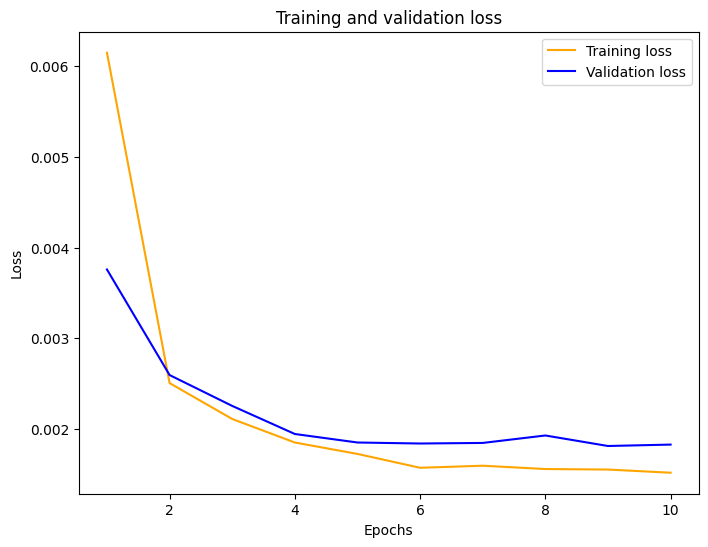

In [133]:
plot_curve(hist_2)

In [134]:
predict_scaled_2 = model_2.predict(X_test)
predict_2 = sc.inverse_transform(predict_scaled_2)
test3['LSTM_Drop_out'] = predict_2
test3

10/10 [==============================] - 1s 3ms/step


,DateTime,cloud_cover,LSTM_50,LSTM_100,LSTM_Drop_out
0,2021-12-16 09:10:00,0.111,0.328873,0.306985,0.329989
1,2021-12-16 09:11:00,0.112,0.129101,0.113523,0.134054
2,2021-12-16 09:12:00,0.116,0.109798,0.124393,0.104228
3,2021-12-16 09:13:00,0.112,0.114621,0.115149,0.109124
4,2021-12-16 09:14:00,0.099,0.113974,0.108481,0.110663
...,...,...,...,...,...
288,2021-12-16 13:58:00,0.168,0.169124,0.158052,0.169599
289,2021-12-16 13:59:00,0.169,0.168930,0.158258,0.169362
290,2021-12-16 14:00:00,0.147,0.169825,0.159020,0.170259
291,2021-12-16 14:01:00,0.145,0.149844,0.138359,0.150535


In [135]:
fig = go.Figure()
fig.add_trace(go.Scatter(mode = 'lines', x = cloud_cover['DateTime'], y = cloud_cover['cloud_cover'], name = 'Actual'))
fig.add_trace(go.Scatter(mode = 'lines', x = test3['DateTime'], y = test3['cloud_cover'], name = 'Actual Test'))
fig.add_trace(go.Scatter(mode = 'lines', x = test3['DateTime'], y = test3['LSTM_Drop_out'], name = 'predict'))
fig.update_layout(
    autosize=True,
    height=600,
    title="LSTM Model",
    xaxis_title="Date",
    yaxis_title="Cloud cover",
)


fig.update_layout(
    xaxis=dict(
        rangeselector=dict(
            buttons=list([
                dict(count=1,
                     label="1.zoom",
                     step="hour",
                     stepmode="backward"),
                 dict(count=2,
                     label="2.zoom",
                     step="hour",
                     stepmode="backward"),
                dict(count=3,
                     label="3.zoom",
                     step="day",
                     stepmode="backward"),              

                dict(step="all")
            ])
        ),
        rangeslider=dict(
            visible=True
        ),
        type="date"
    )
)

fig.show()

In [136]:
lstm_mse_error_100_drop_out = mean_squared_error(test3['cloud_cover'], test3['LSTM_Drop_out'], squared=True)
lstm_rmse_error9 = mean_squared_error(test3["cloud_cover"], test3["LSTM_Drop_out"], squared=False)
lstm_mae_error9 = mae(test3["cloud_cover"], test3["LSTM_Drop_out"])
lstm_mape_error9 = mape(test3['cloud_cover'], test3['LSTM_Drop_out'])
# error(lstm_mse_error_100_drop_out,lstm_rmse_error9,lstm_mae_error9,lstm_mape_error9)

In [177]:
compare_model(lstm_mape_error6,lstm_mape_error9)

Better MSE value is :  0.05333231226971766


,Model,MSE error
0,model,0.053332
1,model_1,0.053539


In [178]:
data8 = [{'Lags':10 ,'Optimizer':'Adam', 'Batch_size':32, 'Learning rate':0.005, 'Frist layer': 50, 'Drop out':0.1, 'Second layer':'', 'Drop out2':'',
              'Third layer':'','Output layer':1, 'Epochs':10 , 'MAE error':lstm_mae_error9, 'MAPE error' : lstm_mape_error9,'MSE error':lstm_mse_error_100_drop_out, 'RMSE error':lstm_rmse_error9}]

mse_data = mse_data.append(data8,ignore_index = True,sort = False)
mse_data

C:\Users\USER\AppData\Local\Temp\ipykernel_6988\337833059.py:4: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.



,Lags,Optimizer,Batch_size,Learning rate,Frist layer,Drop out,Second layer,Drop out2,Third layer,Output layer,Epochs,MAE error,MAPE error,MSE error,RMSE error
0,10,Adam,32,,50,,,,,1,10,0.012136,0.054429,0.001818,0.042640
1,10,RMSprop,32,,50,,,,,1,10,0.015239,0.071949,0.001859,0.043111
2,10,Adam,64,,50,,,,,1,10,0.017186,0.087572,0.002380,0.048786
3,10,Adam,32,0.1,50,,,,,1,10,0.167481,0.911509,0.035691,0.188920
4,10,Adam,32,0.05,50,,,,,1,10,0.024616,0.124375,0.002104,0.045864
5,10,Adam,32,0.01,50,,,,,1,10,0.013826,0.067467,0.001801,0.042441
6,10,Adam,32,0.005,50,,,,,1,10,0.011539,0.053332,0.001807,0.042510
7,10,Adam,32,0.001,50,,,,,1,10,0.013826,0.067467,0.001801,0.042441
8,10,Adam,32,0.005,100,,,,,1,10,0.018319,0.084075,0.001910,0.043706
9,10,Adam,32,0.005,50,0.1,,,,1,10,0.011366,0.053539,0.001819,0.042652


------------------------------------

### Add frist layer: units = 50 and Add second layer: unit = 50

In [138]:
model_3 = Sequential()
model_3.add(LSTM(units = 50, return_sequences = True, input_shape = (X_train.shape[1], 1)))
model_3.add(LSTM(units = 50))
model_3.add(Dense(units = 1))
opt = optimizers.Adam(learning_rate=0.005)
model_3.compile(optimizer = opt, loss = 'mean_squared_error')
hist_3 = model_3.fit(X_train, y_train, validation_data=(X_test, y_test),  epochs = 10, batch_size = 32)

Epoch 1/10
462/462 [==============================] - 21s 23ms/step - loss: 0.0051 - val_loss: 0.0034
Epoch 2/10
462/462 [==============================] - 7s 15ms/step - loss: 0.0016 - val_loss: 0.0020
Epoch 3/10
462/462 [==============================] - 8s 16ms/step - loss: 0.0013 - val_loss: 0.0020
Epoch 4/10
462/462 [==============================] - 7s 15ms/step - loss: 0.0013 - val_loss: 0.0020
Epoch 5/10
462/462 [==============================] - 7s 14ms/step - loss: 0.0013 - val_loss: 0.0020
Epoch 6/10
462/462 [==============================] - 6s 13ms/step - loss: 0.0013 - val_loss: 0.0018
Epoch 7/10
462/462 [==============================] - 7s 15ms/step - loss: 0.0012 - val_loss: 0.0019
Epoch 8/10
462/462 [==============================] - 7s 16ms/step - loss: 0.0013 - val_loss: 0.0020
Epoch 9/10
462/462 [==============================] - 8s 18ms/step - loss: 0.0013 - val_loss: 0.0018
Epoch 10/10
462/462 [==============================] - 10s 21ms/step - loss: 0.0012 - val_

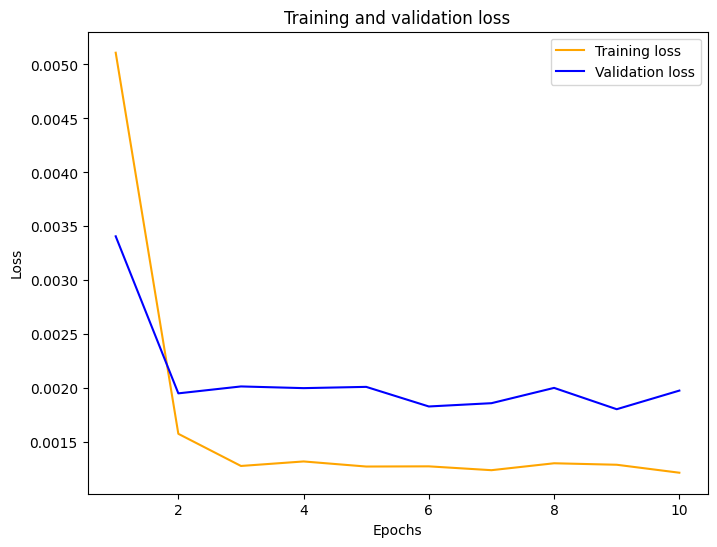

In [139]:
plot_curve(hist_3)

In [140]:
predict_scaled_3 = model_3.predict(X_test)
predict_3 = sc.inverse_transform(predict_scaled_3)
test3['LSTM_second_layer_50'] = predict_3
test3

10/10 [==============================] - 5s 7ms/step


,DateTime,cloud_cover,LSTM_50,LSTM_100,LSTM_Drop_out,LSTM_second_layer_50
0,2021-12-16 09:10:00,0.111,0.328873,0.306985,0.329989,0.338972
1,2021-12-16 09:11:00,0.112,0.129101,0.113523,0.134054,0.139234
2,2021-12-16 09:12:00,0.116,0.109798,0.124393,0.104228,0.113527
3,2021-12-16 09:13:00,0.112,0.114621,0.115149,0.109124,0.117049
4,2021-12-16 09:14:00,0.099,0.113974,0.108481,0.110663,0.116894
...,...,...,...,...,...,...
288,2021-12-16 13:58:00,0.168,0.169124,0.158052,0.169599,0.174286
289,2021-12-16 13:59:00,0.169,0.168930,0.158258,0.169362,0.174071
290,2021-12-16 14:00:00,0.147,0.169825,0.159020,0.170259,0.174950
291,2021-12-16 14:01:00,0.145,0.149844,0.138359,0.150535,0.155155


In [141]:
fig = go.Figure()
fig.add_trace(go.Scatter(mode = 'lines', x = cloud_cover['DateTime'], y = cloud_cover['cloud_cover'], name = 'Actual'))
fig.add_trace(go.Scatter(mode = 'lines', x = test3['DateTime'], y = test3['cloud_cover'], name = 'Actual Test'))
fig.add_trace(go.Scatter(mode = 'lines', x = test3['DateTime'], y = test3['LSTM_second_layer_50'], name = 'predict'))
fig.update_layout(
    autosize=True,
    height=600,
    title="LSTM Model",
    xaxis_title="Date",
    yaxis_title="Cloud cover",
)


fig.update_layout(
    xaxis=dict(
        rangeselector=dict(
            buttons=list([
                dict(count=1,
                     label="1.zoom",
                     step="hour",
                     stepmode="backward"),
                 dict(count=2,
                     label="2.zoom",
                     step="hour",
                     stepmode="backward"),
                dict(count=3,
                     label="3.zoom",
                     step="day",
                     stepmode="backward"),              

                dict(step="all")
            ])
        ),
        rangeslider=dict(
            visible=True
        ),
        type="date"
    )
)

fig.show()

In [143]:
lstm_mse_error_second_layer = mean_squared_error(test3['cloud_cover'], test3['LSTM_second_layer_50'], squared=True)
lstm_rmse_error11 = mean_squared_error(test3["cloud_cover"], test3["LSTM_second_layer_50"], squared=False)
lstm_mae_error11 = mae(test3["cloud_cover"], test3["LSTM_second_layer_50"])
lstm_mape_error11 = mape(test3['cloud_cover'], test3['LSTM_second_layer_50'])
# error(lstm_mse_error_second_layer,lstm_rmse_error11,lstm_mae_error11,lstm_mape_error11)


In [179]:
compare_model(lstm_mape_error6,lstm_mape_error11)

Better MSE value is :  0.05333231226971766


,Model,MSE error
0,model,0.053332
1,model_1,0.066181


In [180]:
data10 = [{'Lags':10 ,'Optimizer':'Adam', 'Batch_size':32, 'Learning rate':0.005, 'Frist layer': 50, 'Drop out':'', 'Second layer':50, 'Drop out2':'',
              'Third layer':'','Output layer':1, 'Epochs':10 , 'MAE error':lstm_mae_error11, 'MAPE error' : lstm_mape_error11,'MSE error':lstm_mse_error_second_layer, 'RMSE error':lstm_rmse_error11}]

mse_data = mse_data.append(data10,ignore_index = True,sort = False)
mse_data

C:\Users\USER\AppData\Local\Temp\ipykernel_6988\2012156758.py:4: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.



,Lags,Optimizer,Batch_size,Learning rate,Frist layer,Drop out,Second layer,Drop out2,Third layer,Output layer,Epochs,MAE error,MAPE error,MSE error,RMSE error
0,10,Adam,32,,50,,,,,1,10,0.012136,0.054429,0.001818,0.042640
1,10,RMSprop,32,,50,,,,,1,10,0.015239,0.071949,0.001859,0.043111
2,10,Adam,64,,50,,,,,1,10,0.017186,0.087572,0.002380,0.048786
3,10,Adam,32,0.1,50,,,,,1,10,0.167481,0.911509,0.035691,0.188920
4,10,Adam,32,0.05,50,,,,,1,10,0.024616,0.124375,0.002104,0.045864
5,10,Adam,32,0.01,50,,,,,1,10,0.013826,0.067467,0.001801,0.042441
6,10,Adam,32,0.005,50,,,,,1,10,0.011539,0.053332,0.001807,0.042510
7,10,Adam,32,0.001,50,,,,,1,10,0.013826,0.067467,0.001801,0.042441
8,10,Adam,32,0.005,100,,,,,1,10,0.018319,0.084075,0.001910,0.043706
9,10,Adam,32,0.005,50,0.1,,,,1,10,0.011366,0.053539,0.001819,0.042652


---

### Add frist layer: units = 50 and change epochs from 10 to 20

In [181]:
model_5 = Sequential()
model_5.add(LSTM(units = 50, return_sequences = False, input_shape = (X_train.shape[1], 1)))
model_5.add(Dense(units = 1))
opt = optimizers.Adam(learning_rate=0.005)
model_5.compile(optimizer = opt, loss = 'mean_squared_error')
hist_5 = model_5.fit(X_train, y_train, validation_data=(X_test, y_test), epochs = 20, batch_size = 32)

Epoch 1/20
462/462 [==============================] - 7s 8ms/step - loss: 0.0043 - val_loss: 0.0034
Epoch 2/20
462/462 [==============================] - 3s 6ms/step - loss: 0.0016 - val_loss: 0.0022
Epoch 3/20
462/462 [==============================] - 3s 6ms/step - loss: 0.0013 - val_loss: 0.0019
Epoch 4/20
462/462 [==============================] - 3s 6ms/step - loss: 0.0012 - val_loss: 0.0019
Epoch 5/20
462/462 [==============================] - 3s 5ms/step - loss: 0.0012 - val_loss: 0.0018
Epoch 6/20
462/462 [==============================] - 2s 5ms/step - loss: 0.0012 - val_loss: 0.0018
Epoch 7/20
462/462 [==============================] - 2s 5ms/step - loss: 0.0012 - val_loss: 0.0018
Epoch 8/20
462/462 [==============================] - 3s 6ms/step - loss: 0.0012 - val_loss: 0.0021
Epoch 9/20
462/462 [==============================] - 3s 5ms/step - loss: 0.0012 - val_loss: 0.0019
Epoch 10/20
462/462 [==============================] - 3s 6ms/step - loss: 0.0012 - val_loss: 0.0018

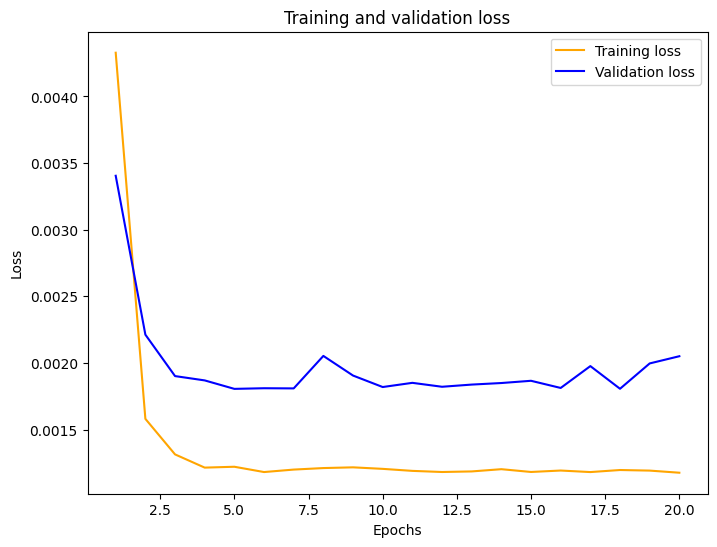

In [182]:
plot_curve(hist_5)

In [183]:
predict_scaled_5 = model_5.predict(X_test)
predict_5 = sc.inverse_transform(predict_scaled_5)
test3['LSTM_epoch20'] = predict_5
test3

10/10 [==============================] - 1s 3ms/step


,DateTime,cloud_cover,LSTM_50,LSTM_100,LSTM_Drop_out,LSTM_second_layer_50,LSTM_epoch20
0,2021-12-16 09:10:00,0.111,0.328873,0.306985,0.329989,0.338972,0.335925
1,2021-12-16 09:11:00,0.112,0.129101,0.113523,0.134054,0.139234,0.134498
2,2021-12-16 09:12:00,0.116,0.109798,0.124393,0.104228,0.113527,0.140466
3,2021-12-16 09:13:00,0.112,0.114621,0.115149,0.109124,0.117049,0.138471
4,2021-12-16 09:14:00,0.099,0.113974,0.108481,0.110663,0.116894,0.131394
...,...,...,...,...,...,...,...
288,2021-12-16 13:58:00,0.168,0.169124,0.158052,0.169599,0.174286,0.180187
289,2021-12-16 13:59:00,0.169,0.168930,0.158258,0.169362,0.174071,0.180286
290,2021-12-16 14:00:00,0.147,0.169825,0.159020,0.170259,0.174950,0.181131
291,2021-12-16 14:01:00,0.145,0.149844,0.138359,0.150535,0.155155,0.160072


In [184]:
fig = go.Figure()
fig.add_trace(go.Scatter(mode = 'lines', x = cloud_cover['DateTime'], y = cloud_cover['cloud_cover'], name = 'Actual'))
fig.add_trace(go.Scatter(mode = 'lines', x = test3['DateTime'], y = test3['cloud_cover'], name = 'Actual Test'))
fig.add_trace(go.Scatter(mode = 'lines', x = test3['DateTime'], y = test3['LSTM_epoch20'], name = 'predict'))
fig.update_layout(
    autosize=True,
    height=600,
    title="LSTM Model",
    xaxis_title="Date",
    yaxis_title="Cloud cover",
)


fig.update_layout(
    xaxis=dict(
        rangeselector=dict(
            buttons=list([
                dict(count=1,
                     label="1.zoom",
                     step="hour",
                     stepmode="backward"),
                 dict(count=2,
                     label="2.zoom",
                     step="hour",
                     stepmode="backward"),
                dict(count=3,
                     label="3.zoom",
                     step="day",
                     stepmode="backward"),              

                dict(step="all")
            ])
        ),
        rangeslider=dict(
            visible=True
        ),
        type="date"
    )
)

fig.show()

In [185]:
lstm_mse_error_unit_50_epoch20 = mean_squared_error(test3['cloud_cover'], test3['LSTM_epoch20'], squared=True)
lstm_rmse_error12 = mean_squared_error(test3["cloud_cover"], test3["LSTM_epoch20"], squared=False)
lstm_mae_error12 = mae(test3["cloud_cover"], test3["LSTM_epoch20"])
lstm_mape_error12 = mape(test3['cloud_cover'], test3['LSTM_epoch20'])
# error(lstm_mse_error_unit_50_epoch20,lstm_rmse_error12,lstm_mae_error12,lstm_mape_error12)

In [186]:
compare_model(lstm_mape_error6,lstm_mape_error12)

Better MSE value is :  0.05333231226971766


,Model,MSE error
0,model,0.053332
1,model_1,0.094820


In [187]:
data11 = [{'Lags':10 ,'Optimizer':'Adam', 'Batch_size':32, 'Learning rate':0.005, 'Frist layer': 50, 'Drop out':'', 'Second layer':'', 'Drop out2':'',
              'Third layer':'','Output layer':1, 'Epochs':20 , 'MAE error':lstm_mae_error12, 'MAPE error' : lstm_mape_error12,'MSE error':lstm_mse_error_unit_50_epoch20, 'RMSE error':lstm_rmse_error12}]

mse_data = mse_data.append(data11,ignore_index = True,sort = False)
mse_data

C:\Users\USER\AppData\Local\Temp\ipykernel_6988\591873696.py:4: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.



,Lags,Optimizer,Batch_size,Learning rate,Frist layer,Drop out,Second layer,Drop out2,Third layer,Output layer,Epochs,MAE error,MAPE error,MSE error,RMSE error
0,10,Adam,32,,50,,,,,1,10,0.012136,0.054429,0.001818,0.042640
1,10,RMSprop,32,,50,,,,,1,10,0.015239,0.071949,0.001859,0.043111
2,10,Adam,64,,50,,,,,1,10,0.017186,0.087572,0.002380,0.048786
3,10,Adam,32,0.1,50,,,,,1,10,0.167481,0.911509,0.035691,0.188920
4,10,Adam,32,0.05,50,,,,,1,10,0.024616,0.124375,0.002104,0.045864
5,10,Adam,32,0.01,50,,,,,1,10,0.013826,0.067467,0.001801,0.042441
6,10,Adam,32,0.005,50,,,,,1,10,0.011539,0.053332,0.001807,0.042510
7,10,Adam,32,0.001,50,,,,,1,10,0.013826,0.067467,0.001801,0.042441
8,10,Adam,32,0.005,100,,,,,1,10,0.018319,0.084075,0.001910,0.043706
9,10,Adam,32,0.005,50,0.1,,,,1,10,0.011366,0.053539,0.001819,0.042652


---

# save model

In [188]:
mse_data = mse_data.round({"MSE error": 6, "MAE error": 6, "MAPE error": 6, "RMSE error": 6})

In [189]:
mse_data.to_csv('data_last_day_lag10.csv',index=False)

In [190]:
lstm = pd.read_csv('data_last_day_lag10.csv')

In [191]:
lstm

,Lags,Optimizer,Batch_size,Learning rate,Frist layer,Drop out,Second layer,Drop out2,Third layer,Output layer,Epochs,MAE error,MAPE error,MSE error,RMSE error
0,10,Adam,32,NaN,50,NaN,NaN,NaN,NaN,1,10,0.012136,0.054429,0.001818,0.042640
1,10,RMSprop,32,NaN,50,NaN,NaN,NaN,NaN,1,10,0.015239,0.071949,0.001859,0.043111
2,10,Adam,64,NaN,50,NaN,NaN,NaN,NaN,1,10,0.017186,0.087572,0.002380,0.048786
3,10,Adam,32,0.100,50,NaN,NaN,NaN,NaN,1,10,0.167481,0.911509,0.035691,0.188920
4,10,Adam,32,0.050,50,NaN,NaN,NaN,NaN,1,10,0.024616,0.124375,0.002104,0.045864
5,10,Adam,32,0.010,50,NaN,NaN,NaN,NaN,1,10,0.013826,0.067467,0.001801,0.042441
6,10,Adam,32,0.005,50,NaN,NaN,NaN,NaN,1,10,0.011539,0.053332,0.001807,0.042510
7,10,Adam,32,0.001,50,NaN,NaN,NaN,NaN,1,10,0.013826,0.067467,0.001801,0.042441
8,10,Adam,32,0.005,100,NaN,NaN,NaN,NaN,1,10,0.018319,0.084075,0.001910,0.043706
9,10,Adam,32,0.005,50,0.1,NaN,NaN,NaN,1,10,0.011366,0.053539,0.001819,0.042652


# error

In [192]:
error = lstm.groupby(['Lags'])[['MAE error','MAPE error','MSE error','RMSE error']].transform(min) == lstm[['MAE error','MAPE error','MSE error','RMSE error']]
lstm[error]

,Lags,Optimizer,Batch_size,Learning rate,Frist layer,Drop out,Second layer,Drop out2,Third layer,Output layer,Epochs,MAE error,MAPE error,MSE error,RMSE error
0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.001801,0.042441
6,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.053332,NaN,NaN
7,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.001801,0.042441
8,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.011366,NaN,NaN,NaN


In [193]:
model_0005.save('model_last_day_lag10.h5')